In [61]:
#basic imports
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

#NLP imports
import nltk
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer

import string
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('words')
nltk.download('wordnet')

#Classification imports
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.feature_extraction import stop_words
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer,TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline,make_pipeline
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.pipeline import make_pipeline as make_pipeline_imb
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import plot_confusion_matrix

from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier,LogisticRegression
from sklearn.svm import LinearSVC, SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [62]:
#loading data into a dataframe.
df = pd.read_csv("Job titles and industries.csv")
df.head()

,job title,industry
0,"technical support and helpdesk supervisor - county buildings, ayr soa04086",IT
1,senior technical support engineer,IT
2,head of it services,IT
3,js front end engineer,IT
4,network and telephony controller,IT


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8586 entries, 0 to 8585
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   job title  8586 non-null   object
 1   industry   8586 non-null   object
dtypes: object(2)
memory usage: 134.3+ KB


In [64]:
df.isnull().sum()

job title    0
industry     0
dtype: int64

In [65]:
df.isna().sum()

job title    0
industry     0
dtype: int64

In [66]:
print('Length of the dataset : {} data samples'.format(len(df)))
print('Dataset columns : {}'.format(df.columns))

Length of the dataset : 8586 data samples
Dataset columns : Index(['job title', 'industry'], dtype='object')


In [67]:
print('Number of duplicates in dataset = {}'.format(df.duplicated().sum()))

Number of duplicates in dataset = 4618


In [68]:
print('Number of duplicates in dataset = {}'.format(df.duplicated().sum()))
print('But we will not drop these duplicates as this will add bias to data and model ')
print('Also this will reduce the dataset by its half ')

Number of duplicates in dataset = 4618
But we will not drop these duplicates as this will add bias to data and model 
Also this will reduce the dataset by its half 


# Data visualization

In [69]:
print('There are {} unique job titles'.format(df['job title'].nunique()))
print('in {} unique industries '.format(df['industry'].nunique()))

There are 3890 unique job titles
in 4 unique industries 


In [70]:
print("the industries are : ",df['industry'].unique())

the industries are :  ['IT' 'Marketing' 'Education' 'Accountancy']


In [71]:
df.groupby('industry').count()

,job title
industry,
Accountancy,374
Education,1435
IT,4746
Marketing,2031


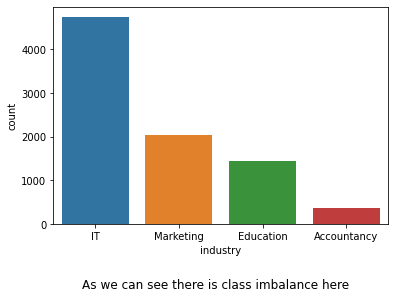

In [72]:
sns.countplot(data=df, x='industry');
txt="As we can see there is class imbalance here"
plt.figtext(0.5, -0.1, txt, wrap=True, horizontalalignment='center', fontsize=12);

# Text Preprocessing

In [73]:
pd.set_option("display.max_rows", None, "display.max_columns", None,'display.max_colwidth', -1)

In [74]:
df['job title']

0       technical support and helpdesk supervisor - county buildings, ayr soa04086                          
1       senior technical support engineer                                                                   
2       head of it services                                                                                 
3       js front end engineer                                                                               
4       network and telephony controller                                                                    
5       privileged access management expert                                                                 
6       devops engineers x 3 - global brand                                                                 
7       devops engineers x 3 - global brand                                                                 
8       data modeller                                                                                       
9       php web dev

from inspecting the data; we need to remove the following:
arabic letters
words after comas or hyphen or between parentheses or /unless back-end or front-end
words to remove : grade,


## Text Cleaning

In [75]:
stopwords = nltk.corpus.stopwords.words('english')
words = set(nltk.corpus.words.words())
lemmatizer = WordNetLemmatizer()

In [76]:
stopwords.remove("it") # as this will remove all job title containing IT short for information technology
stopwords.extend(["year","ks"])

In [77]:
df['job_title_proc'] = df['job title'].str.lower()
df['job_title_proc'] = df['job_title_proc'].str.replace(r"\(.*\)","")
df['job_title_proc'] = df['job_title_proc'].str.replace(r'\b-\b', " ")
df['job_title_proc'] = df['job_title_proc'].str.replace(r'/', " ")

df['job_title_proc'] = df['job_title_proc'].str.split('-').str[0]
df['job_title_proc'] = df['job_title_proc'].str.split(',').str[0]
df['job_title_proc'] = df['job_title_proc'].str.replace(r'"', "")
df['job_title_proc'] = df['job_title_proc'].str.split('–').str[0]
df['job_title_proc'] =  df['job_title_proc'].apply(lambda x: x.replace(']','').replace('[','')) 
df['job_title_proc'] =  df['job_title_proc'].str.replace('\d+', '')
df['job_title_proc'] =  df['job_title_proc'].str.replace('£','')

df['job_title_proc'] =  df['job_title_proc'].str.replace('[{}]'.format(string.punctuation), '')
df['job_title_proc'] =  df['job_title_proc'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df['job_title_proc'] =  df['job_title_proc'].str.replace('[^a-zA-Z] ', '')

In [78]:
# this block of code was to remove any non-Enlish words as there were arabic and french words, but when used it, it led to removing
# a lot of words that are related to job titles and important for model learning
'''
import nltk
words = set(nltk.corpus.words.words()) 

df['job_title_proc'] = [" ".join(w for w in nltk.wordpunct_tokenize(x)  # this step caused a lot of data loss and meaningless job titles
                       if w.lower() in words or not w.isalpha()) 
                       for x in df['job_title_proc']]

'''

'\nimport nltk\nwords = set(nltk.corpus.words.words()) \n\ndf[\'job_title_proc\'] = [" ".join(w for w in nltk.wordpunct_tokenize(x)  # this step caused a lot of data loss and meaningless job titles\n                       if w.lower() in words or not w.isalpha()) \n                       for x in df[\'job_title_proc\']]\n\n'

In [79]:
df

,job title,industry,job_title_proc
0,"technical support and helpdesk supervisor - county buildings, ayr soa04086",IT,technical support helpdesk supervisor
1,senior technical support engineer,IT,senior technical support engineer
2,head of it services,IT,head it services
3,js front end engineer,IT,js front end engineer
4,network and telephony controller,IT,network telephony controller
5,privileged access management expert,IT,privileged access management expert
6,devops engineers x 3 - global brand,IT,devops engineers x
7,devops engineers x 3 - global brand,IT,devops engineers x
8,data modeller,IT,data modeller
9,"php web developer £45,000 based in london",IT,php web developer


In [80]:
def lemmatization(listofSentence):
  '''
   this function is used for lemmatizing words in dataset
   inputs : sentence, row by row in a column
   output : lemmatized sentence in each row in a column
  '''
  preprocess_list = []
  #stemmer = SnowballStemmer(language="english")
  lemmatizer = WordNetLemmatizer()

  for sentence in listofSentence :   
    tokenize_sentence = nltk.tokenize.word_tokenize(sentence)
    words_lemmatize = (lemmatizer.lemmatize(w) for w in tokenize_sentence)         
    sentence_clean = ' '.join(w for w in words_lemmatize )
    preprocess_list.append(sentence_clean)
    
  return preprocess_list

In [81]:
df['clean_job_title'] = lemmatization(df['job_title_proc'])
df

,job title,industry,job_title_proc,clean_job_title
0,"technical support and helpdesk supervisor - county buildings, ayr soa04086",IT,technical support helpdesk supervisor,technical support helpdesk supervisor
1,senior technical support engineer,IT,senior technical support engineer,senior technical support engineer
2,head of it services,IT,head it services,head it service
3,js front end engineer,IT,js front end engineer,j front end engineer
4,network and telephony controller,IT,network telephony controller,network telephony controller
5,privileged access management expert,IT,privileged access management expert,privileged access management expert
6,devops engineers x 3 - global brand,IT,devops engineers x,devops engineer x
7,devops engineers x 3 - global brand,IT,devops engineers x,devops engineer x
8,data modeller,IT,data modeller,data modeller
9,"php web developer £45,000 based in london",IT,php web developer,php web developer


In [82]:
df.isna().sum()

job title          0
industry           0
job_title_proc     0
clean_job_title    0
dtype: int64

# Models

## Traditional machine learning

## Results without Removing duplicates nor handling imbalanced data 

In [83]:
#Step 1: train-test split
X = df['clean_job_title'] 

#the column text contains textual data to extract features from.
y = df['industry']

#this is the column we are learning to predict.
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
#split X and y into training and testing sets. By default, 
#it splits 75% #training and 25% test. random_state=1 for reproducibility

In [84]:
#Step 2-3: Pre-process and Vectorize train and test data
vect = CountVectorizer(max_features=500) 
#clean is a function we defined for pre-processing, seen in the notebook.
X_train_dtm = vect.fit_transform(X_train)
X_test_dtm = vect.transform(X_test)
print(X_train_dtm.shape, X_test_dtm.shape)

(6439, 500) (2147, 500)


In [85]:
models = []

models.append(("LogisticRegression",LogisticRegression()))
models.append(("MultinimialNB", MultinomialNB()))
models.append(("SVC",SVC()))
models.append(("LinearSVC",LinearSVC()))
models.append(("RandomForest",RandomForestClassifier()))

In [86]:
accuracy = []
names = []
for name,model in models:
  model.fit(X_train_dtm, y_train)
  y_pred_class = model.predict(X_test_dtm)    
  names.append(name)
  accuracy.append(accuracy_score(y_test, y_pred_class))

for i in range(len(names)):
    print("{} accuracy = {:.3f}".format(names[i],accuracy[i]))

LogisticRegression accuracy = 0.930
MultinimialNB accuracy = 0.914
SVC accuracy = 0.937
LinearSVC accuracy = 0.932
RandomForest accuracy = 0.919


## Dump model for Flask API

In [86]:
from sklearn.svm import LinearSVC
vect = CountVectorizer(max_features=1000) #Step-1
X_train_dtm = vect.fit_transform(X_train)#combined step 2 and 3
X_test_dtm = vect.transform(X_test)
sm = SMOTE(random_state=42)
X_train_res, y_train_res = sm.fit_sample(X_train_dtm, y_train)
classifier = LinearSVC(class_weight='balanced') #notice the “balanced” option
classifier.fit(X_train_res, y_train_res) #fit the model with training data
y_pred_class = classifier.predict(X_test_dtm)
print("Accuracy: ", accuracy_score(y_test, y_pred_class))

Accuracy:  0.9389846297158826


In [89]:
job_title = "graphic designer"
job_vectorized= vect.transform([job_title])
x = classifier.predict(job_vectorized)
x[0]

'Marketing'

In [58]:
from joblib import dump
import pickle

dump(classifier, 'model.joblib')
pickle.dump(vect, open('Vectorizer.pkl', 'wb'))
pickle.dump(classifier, open("model.pkl", 'wb'))

['model.joblib']

## Handling imbalanced data

In [87]:
labels= ['IT' ,'Marketing' ,'Education', 'Accountancy']

### MultinomialNB

In [88]:
model = make_pipeline_imb(TfidfVectorizer(), SMOTE(), MultinomialNB())
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))

Accuracy:  0.9142990218910108
Confusion matrix:  [[1104   44    3   35]
 [  26  475    9   19]
 [  10   19  294   12]
 [   4    3    0   90]]


In [89]:
model = make_pipeline_imb(TfidfVectorizer(), RandomOverSampler(), MultinomialNB())
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))

Accuracy:  0.9222170470423847
Confusion matrix:  [[1116   45    2   23]
 [  26  478    7   18]
 [   9   18  296   12]
 [   4    3    0   90]]


In [90]:
import warnings
warnings.filterwarnings("ignore")

### LogisticRegression

In [91]:
model = make_pipeline_imb(TfidfVectorizer(), SMOTE(), LogisticRegression(class_weight="balanced"))
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))

Accuracy:  0.9306008383791337
Confusion matrix:  [[1139   36    1   10]
 [  28  473   18   10]
 [  12   16  296   11]
 [   3    4    0   90]]


In [92]:
model = make_pipeline_imb(TfidfVectorizer(), RandomOverSampler(), LogisticRegression(class_weight="balanced"))
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))

Accuracy:  0.9343269678621332
Confusion matrix:  [[1142   31    2   11]
 [  24  472   23   10]
 [   7   18  302    8]
 [   2    4    1   90]]


### LinearSVC

In [93]:
model = make_pipeline_imb(TfidfVectorizer(), SMOTE(), LinearSVC(class_weight='balanced'))
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))

Accuracy:  0.9273404750815091
Confusion matrix:  [[1128   34    0   24]
 [  28  478   11   12]
 [  11   19  296    9]
 [   2    4    2   89]]


In [94]:
model = make_pipeline_imb(TfidfVectorizer(sublinear_tf= True ,
                        min_df = 5 ,
                        norm = 'max' ,
                        ngram_range = (1,2)), RandomOverSampler(), LinearSVC(class_weight='balanced'))
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))
print(classification_report_imbalanced(y_test, y_pred))

Accuracy:  0.9180251513740102
Confusion matrix:  [[1119   32   19   16]
 [  28  467   18   16]
 [   8   16  300   11]
 [   2    4    6   85]]
                   pre       rec       spe        f1       geo       iba       sup

Accountancy       0.66      0.88      0.98      0.76      0.93      0.85        97
  Education       0.87      0.90      0.98      0.88      0.94      0.87       335
         IT       0.97      0.94      0.96      0.96      0.95      0.90      1186
  Marketing       0.90      0.88      0.97      0.89      0.92      0.85       529

avg / total       0.92      0.92      0.97      0.92      0.94      0.88      2147



## Removing Duplicates from Data

In [95]:
print("Number of duplicates = {}".format(df.duplicated().sum()))

Number of duplicates = 4618


In [96]:
df_without_dup = df.drop_duplicates(keep="first")
df_without_dup.duplicated().sum()

0

In [97]:
df_without_dup.columns

Index(['job title', 'industry', 'job_title_proc', 'clean_job_title'], dtype='object')

In [98]:
X = df_without_dup['clean_job_title'] 

#the column text contains textual data to extract features from.
y = df_without_dup['industry']

#this is the column we are learning to predict.
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

In [99]:
model = make_pipeline_imb(CountVectorizer(), LinearSVC())
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))

Accuracy:  0.8699596774193549
Confusion matrix:  [[354  37   7   1]
 [ 31 258   1   4]
 [  8  21 198   3]
 [  5   8   3  53]]


In [100]:
model = make_pipeline_imb(TfidfVectorizer(), SMOTE(), LinearSVC(class_weight='balanced'))
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))

Accuracy:  0.873991935483871
Confusion matrix:  [[352  37   4   6]
 [ 26 257   3   8]
 [  9  20 196   5]
 [  1   4   2  62]]


Accuracy:  0.8558467741935484
Confusion matrix:  [[346  38   4  11]
 [ 20 252   4  18]
 [  9  24 188   9]
 [  1   5   0  63]]


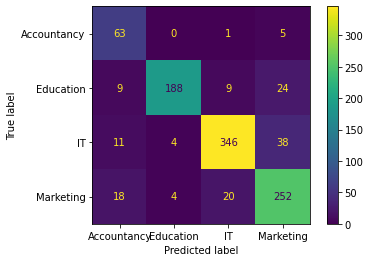

In [101]:
model = make_pipeline_imb(TfidfVectorizer(), SMOTE(), MultinomialNB())
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("Confusion matrix: ", confusion_matrix(y_test, y_pred,labels=labels))

plot_confusion_matrix(model, X_test, y_test,values_format='d')  
plt.show()  

# RNN model

In [102]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Input, GlobalMaxPooling1D
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Embedding, LSTM,SpatialDropout1D
from keras.layers import Flatten
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.initializers import Constant
from tensorflow.keras.utils import plot_model

In [103]:
MAX_SEQUENCE_LENGTH = 1000
MAX_NUM_WORDS = 2000 
EMBEDDING_DIM = 100 
VALIDATION_SPLIT = 0.2

In [104]:
#Step 1: train-test split
X = df['clean_job_title'] 
#the column text contains textual data to extract features from.
y = df['industry']
#this is the column we are learning to predict.
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
X_train, X_val, y_train, y_val= train_test_split(X_train, y_train,train_size=0.7, random_state=1)
#split X and y into training and testing sets. By default, 
#it splits 75% #training and 25% test. random_state=1 for reproducibility.

In [105]:
Y = pd.get_dummies(df['industry']).values
print('Shape of label tensor:', Y.shape)

X = df['clean_job_title'] 
#the column text contains textual data to extract features from.
X_train, X_test, y_train, y_test = train_test_split(X, Y, random_state=1)
X_train, X_val, y_train, y_val= train_test_split(X_train, y_train,train_size=0.7, random_state=1)

Shape of label tensor: (8586, 4)


In [106]:
len(y_train)

4507

## INTEGER ENCODING ALL THE DOCUMENTS
All the unique words will be reprsented by an integer. For this we are using one_hot function from the Keras. Then Padding is used for all the sequences to have the same length

In [107]:
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences

In [108]:
encoded_docs = [one_hot(d, len(X_train)) for d in X_train]
print(encoded_docs)

[[1423, 241, 1877, 3453], [2757, 2418, 3453, 4242, 3885, 3869, 3453], [975, 2699], [173, 555, 2557, 3453], [2757, 2418, 3453], [743, 3956, 1144, 3396, 1330], [1877, 3453], [2757, 1330, 3318, 3065], [2830, 2621, 1144], [1423, 1719, 3958], [3290, 3453], [1877, 3453], [2251, 2439, 1745], [871, 240, 3453], [2830, 2291, 1368], [545, 2418, 1144], [2856, 2699], [1008], [2882, 1609, 2699], [2291, 3119, 2727], [1721, 809], [2291, 1080, 809], [2003, 88, 3885], [2882, 117, 3568, 3288, 978], [2316, 2326, 1877, 3453], [4274, 2727], [241, 3290, 3453], [2316, 2326, 994, 2699], [241, 3966, 4101, 2291, 1144], [2882, 88, 3453], [3737, 2621, 809], [3288, 3871], [1080, 3445], [2621, 1368], [2334, 1144], [994, 3453, 4364, 3160], [3129, 2595, 175], [3782, 2291, 1423], [2712, 2538, 1451, 3453], [2621, 1008], [3337, 2699], [2291, 1144], [2882, 1451, 3453], [1423, 3956, 1144], [3245, 4030, 2699, 2940], [2595, 175], [1451, 3453], [2291, 809], [3392, 175], [2757, 1144], [3392, 175], [2882, 545, 2418, 3453], [346

In [109]:
# pad documents to a max length of 4 words
max_length = 4
padded_docs = pad_sequences(encoded_docs, maxlen=max_length, padding='post')
padded_docs

array([[1423,  241, 1877, 3453],
       [4242, 3885, 3869, 3453],
       [ 975, 2699,    0,    0],
       ...,
       [1423, 3283, 3453,    0],
       [2595,  175, 2949,    0],
       [1877, 4233, 3453,    0]], dtype=int32)

In [110]:
encoded_docs2 = [one_hot(d, len(X_val)) for d in X_val]
print(encoded_docs2)
# pad documents to a max length of 4 words
print("//////////////////////////////////////////////////")
max_length = 4
padded_docs2 = pad_sequences(encoded_docs2, maxlen=max_length, padding='post')
padded_docs2

[[1756, 1023], [1008, 1472, 33], [1607, 1663, 918, 185], [336, 1019], [1301, 131, 1319, 512, 446], [338, 1658, 1669], [1607, 1021, 1669], [1495, 1794, 42, 673, 301], [390, 897], [780, 673], [1794, 185], [1495, 1663, 673], [1380, 1669], [1400, 1263, 185], [1607, 1016], [1755, 1021, 1095, 1244], [1203, 1669, 456], [1472, 897], [868, 1742, 673], [481, 1669, 1649, 1669, 1289, 1460], [673, 673], [1769, 1654], [472, 1251, 1669], [1633, 1400, 1102], [481, 1031], [1495, 530, 673], [1495, 252, 705, 1576], [1400, 1530, 897], [1041, 1016, 1212], [1570, 1267, 227, 1926], [890, 673], [1495, 1008, 210, 1031], [539, 33], [1495, 898, 1669], [539, 897], [1436, 897], [1899, 1031, 898, 673], [797, 309], [1635, 1908, 223, 58], [1495, 1263, 1669, 1031], [1560, 1023], [1495, 576, 1923], [1380, 1669], [1495, 530, 1669], [1495, 1663, 673], [1576, 897, 91, 387], [1650, 1926, 1095], [1880, 1016], [870, 976], [1623, 1912], [1380, 1669], [1472, 897], [898, 481, 1654], [453, 1380, 1669], [586, 918, 1031], [1021, 1

array([[1756, 1023,    0,    0],
       [1008, 1472,   33,    0],
       [1607, 1663,  918,  185],
       ...,
       [1095,  898, 1654,    0],
       [  94,  586,  483,    0],
       [ 227,  897, 1369,  151]], dtype=int32)

In [111]:
padded_docs

array([[1423,  241, 1877, 3453],
       [4242, 3885, 3869, 3453],
       [ 975, 2699,    0,    0],
       ...,
       [1423, 3283, 3453,    0],
       [2595,  175, 2949,    0],
       [1877, 4233, 3453,    0]], dtype=int32)

In [112]:
np.unique(y_train)

array([0, 1], dtype=uint8)

In [113]:
print(y_train.shape)
print(padded_docs.shape)
print(padded_docs2.shape)
print(y_val.shape)
print(y_test.shape)

vocab_size = 5000 #10000
embedding_dim = 8 #100

#model
rnnmodel = Sequential()
rnnmodel.add(Embedding(vocab_size, embedding_dim,input_length=4))
rnnmodel.add(LSTM(32, activation='relu'))  
rnnmodel.add(Flatten())
rnnmodel.add(Dense(4, activation='softmax'))
rnnmodel.compile(loss='categorical_crossentropy', optimizer='adam',  metrics=['accuracy'])


(4507, 4)
(4507, 4)
(1932, 4)
(1932, 4)
(2147, 4)


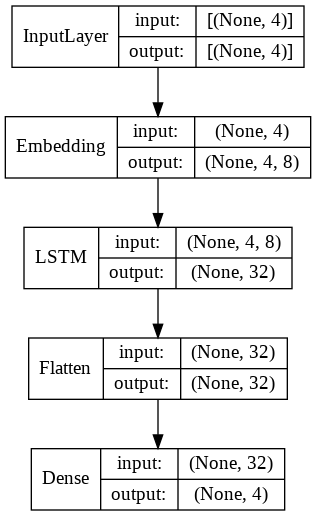

In [114]:
plot_model(
    rnnmodel, to_file='model.png', show_shapes=True, show_dtype=False,
    show_layer_names=False, rankdir='TB', expand_nested=False, dpi=96,
    layer_range=None
)

In [128]:
rnnmodel.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 4, 8)              40000     
_________________________________________________________________
lstm (LSTM)                  (None, 32)                5248      
_________________________________________________________________
flatten (Flatten)            (None, 32)                0         
_________________________________________________________________
dense (Dense)                (None, 4)                 132       
Total params: 45,380
Trainable params: 45,380
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = rnnmodel.fit(padded_docs , y_train ,batch_size=2000,epochs=100,validation_data=(padded_docs2, y_val))
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()